In [1]:
import math
import sys
import os
sys.path.insert(0,'..')
from doe_xstock.data import CityLearnData
from citylearn.cost_function import CostFunction
from citylearn.utilities import read_json
import matplotlib.pyplot as plt
from matplotlib import ticker
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from src.utilities import DataHandler, FileHandler
import json

In [9]:
SIMULATION_IDS = [
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_1-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_2-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_3-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_4-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_5-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_6-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_7-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_8-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_9-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_10-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_11-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_12-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_13-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_14-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_15-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_16-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_17-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_18-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_19-final-2022',
    'lod_3-stable_baselines3-sac-norbc-centralized-comfortreward-building_20-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_1-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_2-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_3-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_4-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_5-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_6-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_7-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_8-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_9-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_10-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_11-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_12-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_13-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_14-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_15-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_16-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_17-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_18-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_19-final-2022',
    'lod_2-stable_baselines3-sac-norbc-centralized-comfortreward-building_20-final-2022',
    'lod_1-citylearn-rbc-norbc-centralized-noreward-building_all-final-2022'
]

###  Indoor Setpoint vs. Heating Demand - LOD 1/LOD3 Comparison

In [10]:
data_reg = pd.concat([DataHandler.get_concat_data(_id, 'time_series') for _id in SIMULATION_IDS], ignore_index=True)
returned_ids = data_reg['id'].unique()
assert len(returned_ids) == len(SIMULATION_IDS)\
    and len(set(SIMULATION_IDS).difference(set(returned_ids))) == 0,\
        'Inconsistent simulation IDs'

unique_values_in_order_reg = data_reg['bldg_name'].unique().tolist()
metadata = pd.read_csv(os.path.join(FileHandler.METADATA_DIRECTORY, 'building_cluster_metadata.csv'))
metadata['bldg_id'] = metadata['bldg_id'].astype(str)
metadata = metadata.rename(columns={'bldg_id': 'bldg_name', 'ID': 'bldg_index'})
data_reg = data_reg.merge(metadata[['bldg_name', 'bldg_index', 'setpoint_id']], on='bldg_name', how='left')
buildings_reg = unique_values_in_order_reg
data_reg = data_reg[data_reg['bldg_name'].isin(buildings_reg)].copy()
data_reg['lod'] = data_reg['id'].str.split('-', expand=True)[0]

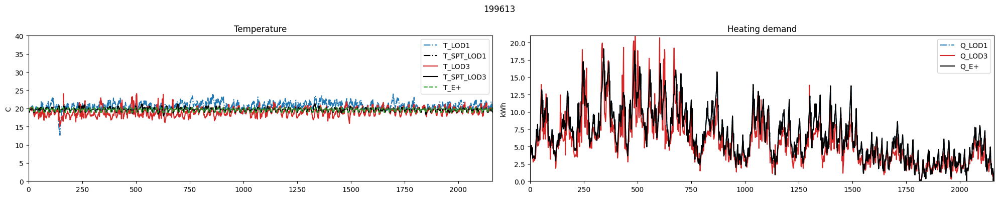

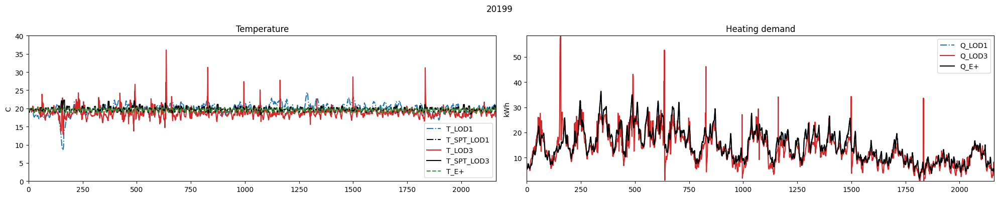

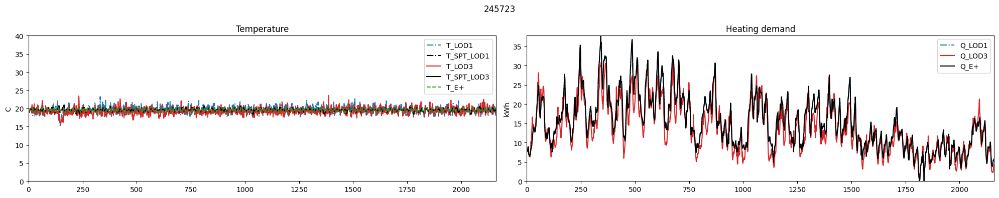

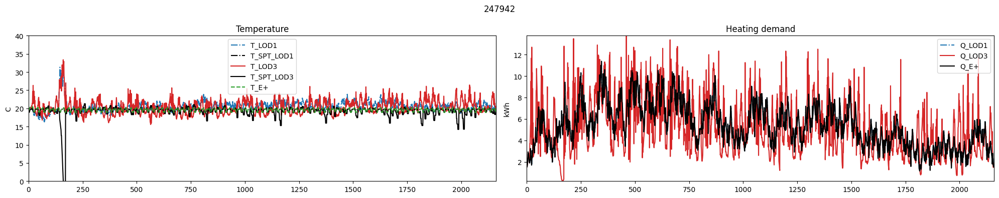

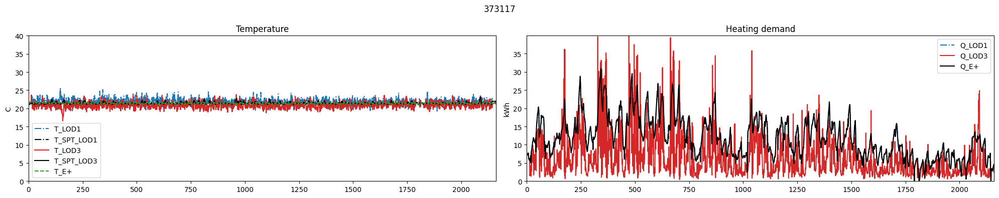

...

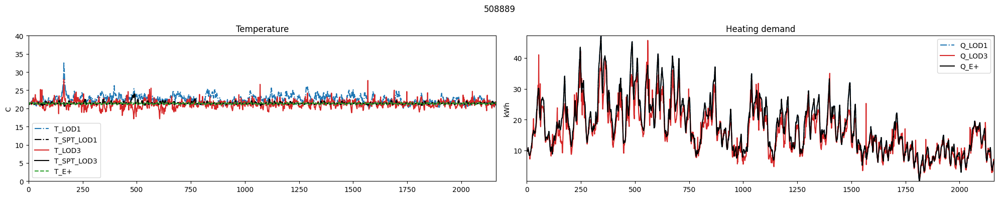

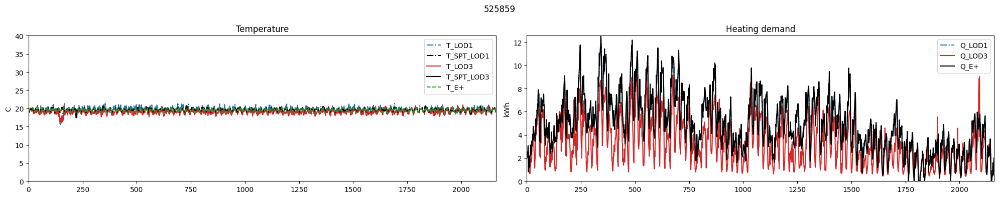

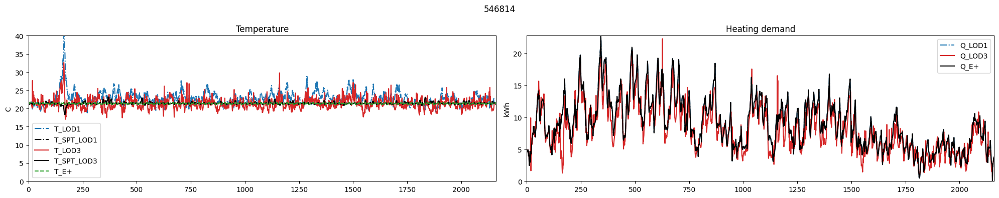

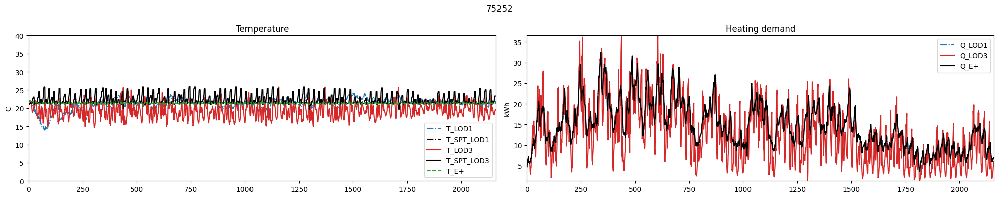

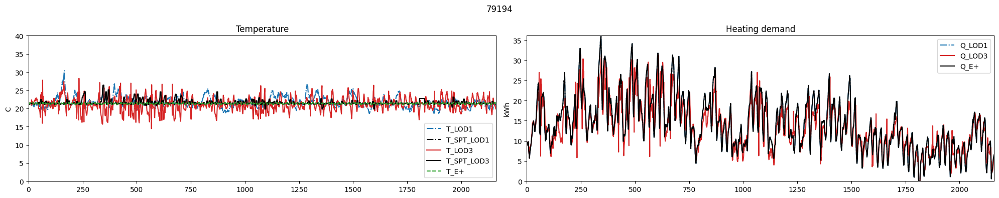

In [11]:
for b, bdata in data_reg.groupby('bldg_name'):
    fig, axs = plt.subplots(1, 2, figsize=(20, 4))
    lod1data = bdata[bdata['lod']=='lod_1'].copy()
    lod3data = bdata[bdata['lod']=='lod_3'].copy()
    x = lod1data['time_step'].tolist()

    # temperature
    y1 = lod1data['indoor_dry_bulb_temperature'].tolist()
    y2 = lod1data['indoor_dry_bulb_temperature_set_point'].tolist()
    y3 = lod3data['indoor_dry_bulb_temperature'].tolist()
    y4 = lod3data['indoor_dry_bulb_temperature_set_point'].tolist()
    y5 = lod3data['indoor_dry_bulb_temperature_without_partial_load'].tolist()
    fig.axes[0].plot(x, y1, label='T_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[0].plot(x, y2, label='T_SPT_LOD1', color='black', linestyle='-.')
    fig.axes[0].plot(x, y3, label='T_LOD3', color='tab:red', linestyle='-')
    fig.axes[0].plot(x, y4, label='T_SPT_LOD3', color='black', linestyle='-')
    fig.axes[0].plot(x, y5, label='T_E+', color='tab:green', linestyle='--')
    fig.axes[0].set_title('Temperature')
    fig.axes[0].set_ylim(0,40)
    fig.axes[0].set_ylabel('C')
    fig.axes[0].margins(0)
    fig.axes[0].legend()
    

    # demand
    y1 = lod1data['heating_demand'].tolist()
    y2 = lod3data['heating_demand'].tolist()
    y3 = lod3data['heating_demand_without_partial_load'].tolist()
    fig.axes[1].plot(x, y1, label='Q_LOD1', color='tab:blue', linestyle='-.')
    fig.axes[1].plot(x, y2, label='Q_LOD3', color='tab:red', linestyle='-')
    fig.axes[1].plot(x, y3, label='Q_E+', color='black', linestyle='-')
    fig.axes[1].set_title('Heating demand')
    fig.axes[1].set_ylabel('kWh')
    fig.axes[1].margins(0)
    fig.axes[1].legend()

    fig.suptitle(b)
    plt.tight_layout()
    plt.show()

### T_in vs T_SP for testing period, LOD 3

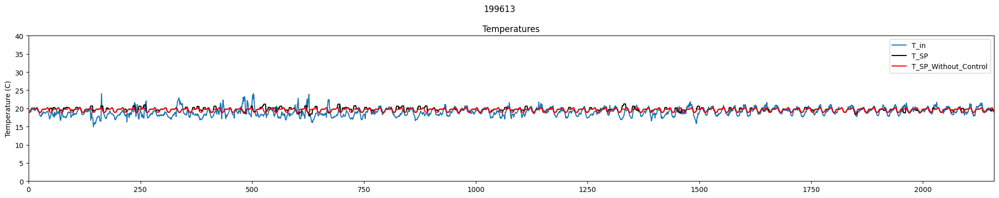

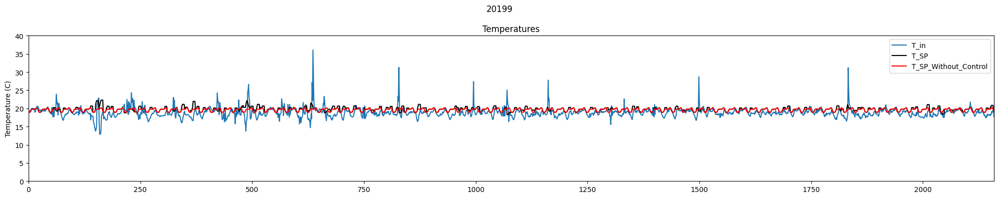

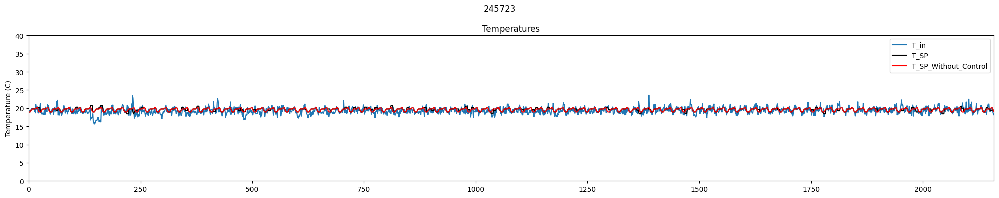

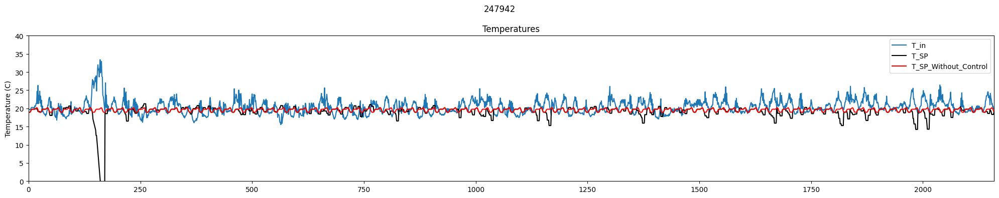

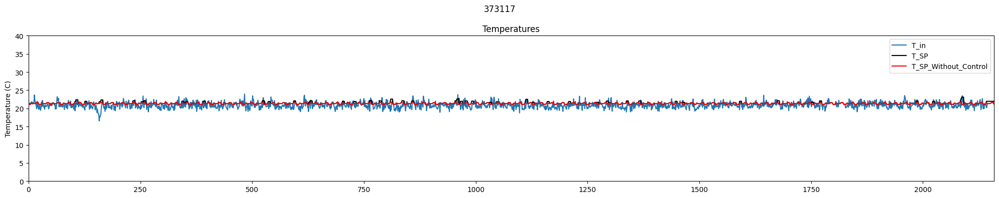

...

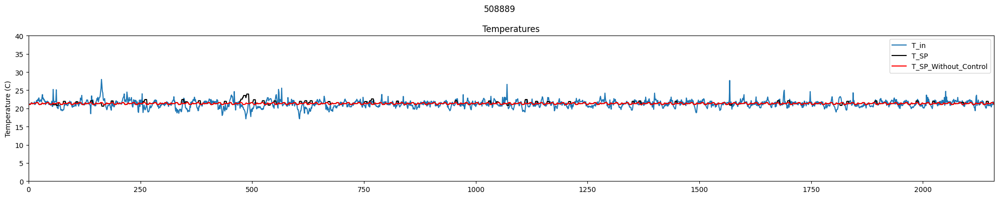

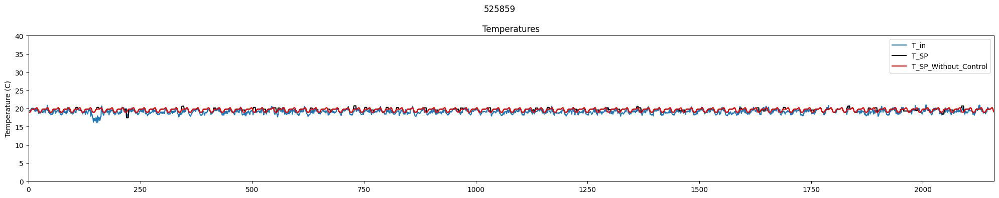

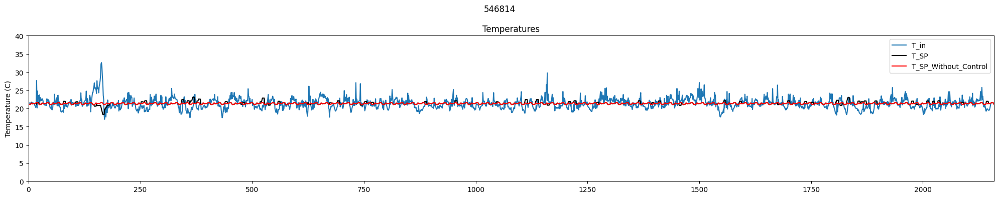

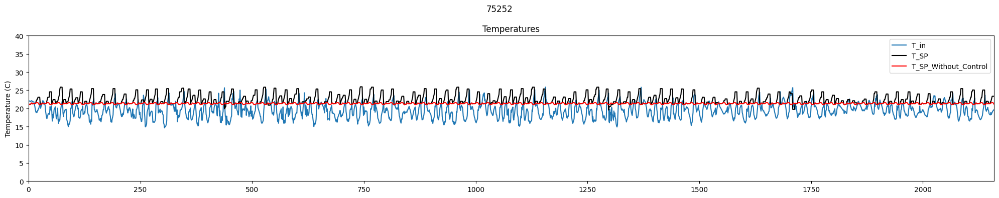

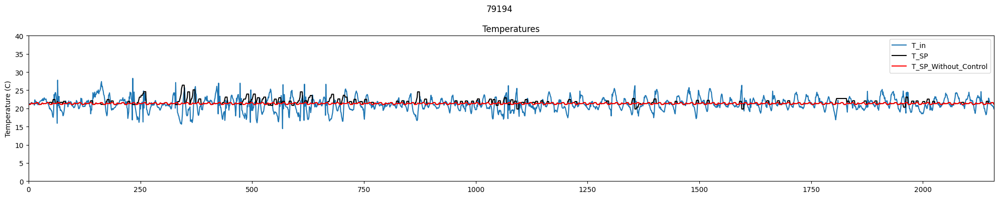

In [12]:
for b, bdata in data_reg.groupby('bldg_name'):
    fig, axs = plt.subplots(1, figsize=(20, 4))
    lod3data = bdata[bdata['lod']=='lod_3'].copy()
    x = lod3data['time_step'].tolist()

    # temperature
    y1 = lod3data['indoor_dry_bulb_temperature'].tolist()
    y2 = lod3data['indoor_dry_bulb_temperature_set_point'].tolist()
    y3 = lod3data['indoor_dry_bulb_temperature_set_point_without_control'].tolist()
    fig.axes[0].plot(x, y1, label='T_in', color='tab:blue') #linestyle='-.')
    fig.axes[0].plot(x, y2, label='T_SP', color='black') #linestyle='-.')
    fig.axes[0].plot(x, y3, label='T_SP_Without_Control', color='red') #linestyle='-.')


    fig.axes[0].set_title('Temperatures')
    fig.axes[0].set_ylim(0,40)
    fig.axes[0].set_ylabel('Temperature (C)')
    fig.axes[0].margins(0)
    fig.axes[0].legend()

    fig.suptitle(b)
    plt.tight_layout()
    plt.show()

In [13]:
print(data_reg.keys())

Index(['bldg_name', 'net_electricity_consumption',
       'net_electricity_consumption_without_storage',
       'net_electricity_consumption_without_storage_and_partial_load',
       'net_electricity_consumption_without_storage_and_partial_load_and_pv',
       'indoor_dry_bulb_temperature',
       'indoor_dry_bulb_temperature_without_partial_load',
       'indoor_dry_bulb_temperature_set_point',
       'indoor_dry_bulb_temperature_set_point_without_control',
       'occupant_count', 'heating_electricity_consumption', 'heating_demand',
       'heating_demand_without_partial_load', 'dhw_electricity_consumption',
       'dhw_demand', 'non_shiftable_load',
       'non_shiftable_load_electricity_consumption',
       'energy_to_non_shiftable_load', 'energy_from_dhw_device',
       'energy_from_heating_device', 'occupant_a_increase',
       'occupant_b_increase', 'occupant_a_decrease', 'occupant_b_decrease',
       'occupant_increase_setpoint_probability',
       'occupant_decrease_setpoint_p

### Plot the net electricity consumption for LOD 1 and LOD 3 for the testing period

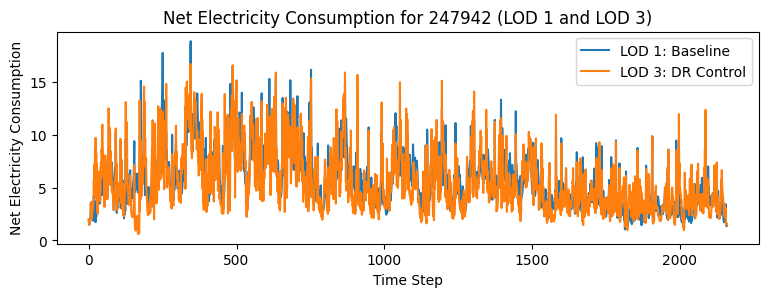

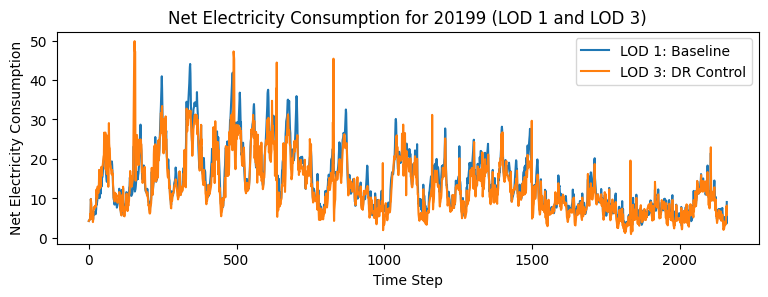

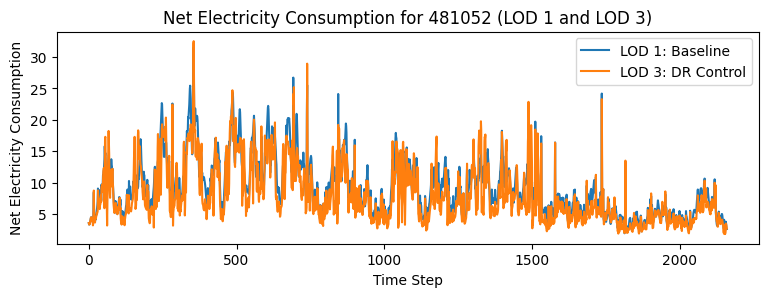

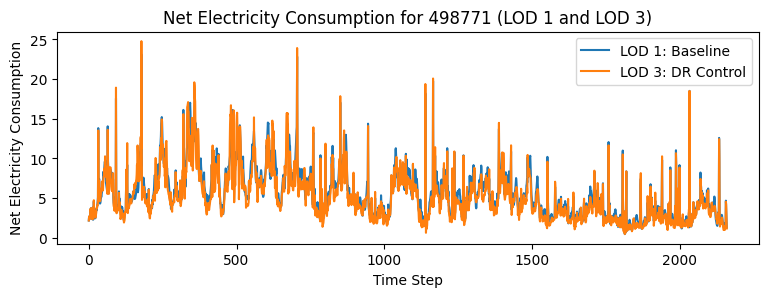

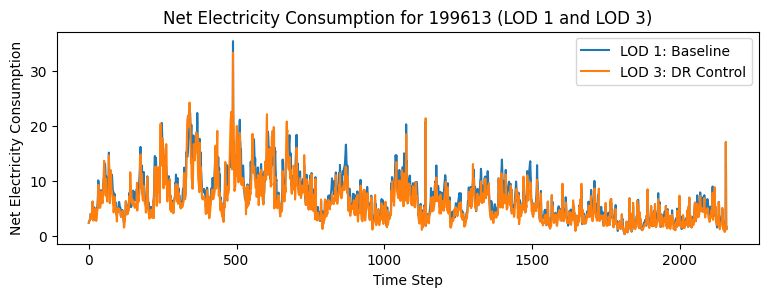

...

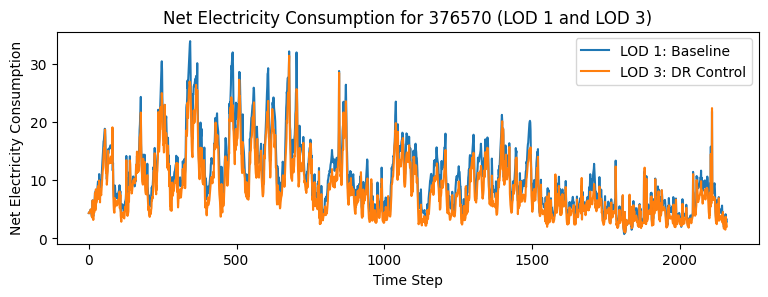

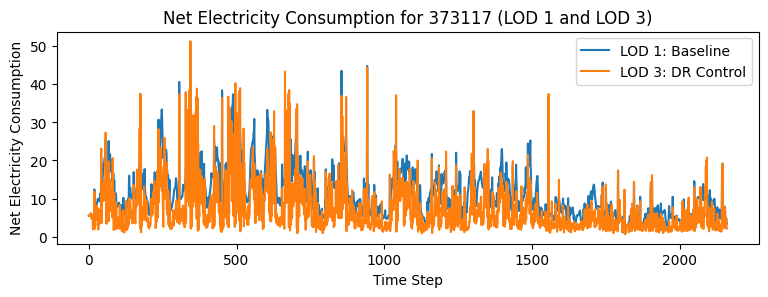

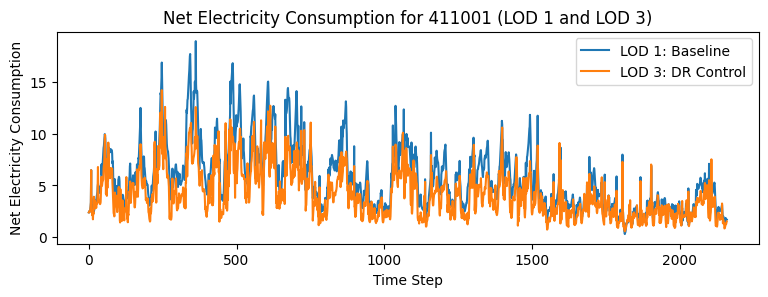

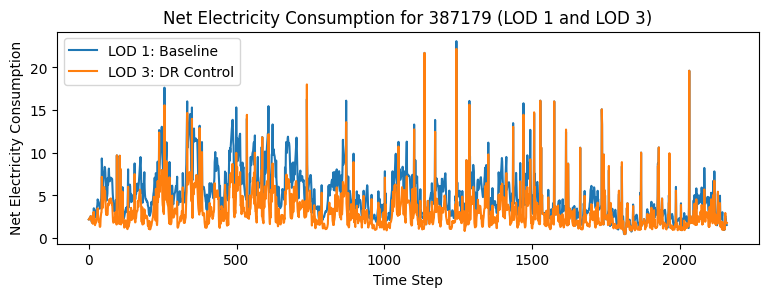

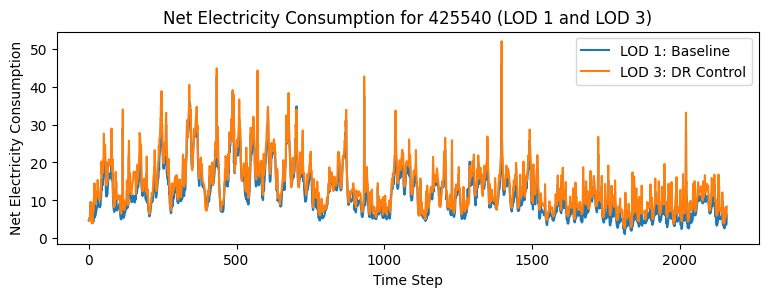

In [14]:
# Extract unique buildings
buildings = data_reg['bldg_name'].unique()

for building in buildings:
    # Create a new figure for each building with specified size
    plt.figure(figsize=(23/2.54, 7/2.54))  # Convert from cm to inches
    
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Plot net electricity consumption for LOD 1
    plt.plot(lod1_data['time_step'], lod1_data['net_electricity_consumption'], label='LOD 1: Baseline')
    
    # Plot net electricity consumption for LOD 3
    plt.plot(lod3_data['time_step'], lod3_data['net_electricity_consumption'], label='LOD 3: DR Control')

    plt.xlabel('Time Step')
    plt.ylabel('Net Electricity Consumption')
    plt.title(f'Net Electricity Consumption for {building} (LOD 1 and LOD 3)')
    plt.legend()
    plt.show()

### Calculate for each building: net electricity consumption during DR events, LOD1 vs LOD3

In [15]:
# Note - change file path to work for your computer
file_path = os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices/DR_Events_2022.csv')

df_DR_events_2022 = pd.read_csv(file_path)

In [16]:
dr_event_electricity_summary = pd.DataFrame(columns=['bldg_name', 'DR_Event', 'lod_1_net_electricity', 'lod_3_net_electricity', 'DR_Savings'])

for building in buildings:
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Filter df_DR_events_2022 for the rows where 'DR_Event_Timestep' = 1
    #dr_event_timestep = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]['time_step'].iloc[0]
    dr_event_timesteps = df_DR_events_2022[df_DR_events_2022['DR_Event_Timestep'] == 1]

    # Filter lod1_data and lod3_data for rows where a dr event occurs (is in dr_event_timesteps)
    lod1_data_dr = lod1_data[lod1_data['time_step'].isin(dr_event_timesteps['time_step'])]
    lod3_data_dr = lod3_data[lod3_data['time_step'].isin(dr_event_timesteps['time_step'])]
    
    # Merge 'DR_Events' column from df_DR_events_2022 into lod1_data_dr and lod3_data_dr by 'time_step'
    lod1_data_dr = pd.merge(lod1_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')
    lod3_data_dr = pd.merge(lod3_data_dr, df_DR_events_2022[['time_step', 'DR_Event']], on='time_step')

    # Sum of net electricity consumption for LOD 1 , LOD 3
    lod1_net_electricity_sum = lod1_data_dr['net_electricity_consumption'].sum()
    lod3_net_electricity_sum = lod3_data_dr['net_electricity_consumption'].sum()
    
    # DR_Savings percentage difference between LOD 1 , LOD 3
    dr_savings = ((lod1_net_electricity_sum - lod3_net_electricity_sum) / lod1_net_electricity_sum) * 100
    
    # Append the summary to dr_event_electricity_summary DataFrame
    dr_event_electricity_summary = dr_event_electricity_summary.append({
        'bldg_name': building,
        'DR_Event': lod1_data_dr['DR_Event'].iloc[0],  # Assuming the DR event is same for LOD 1 and LOD 3
        'lod_1_net_electricity': lod1_net_electricity_sum,
        'lod_3_net_electricity': lod3_net_electricity_sum,
        'DR_Savings': dr_savings
    }, ignore_index=True)

In [17]:
dr_event_electricity_summary

,bldg_name,DR_Event,lod_1_net_electricity,lod_3_net_electricity,DR_Savings
0,247942,1,815.577733,825.556118,-1.223475
1,20199,1,2170.178566,1786.879950,17.662077
2,481052,1,1317.103580,1227.429865,6.808403
3,498771,1,845.612964,705.594639,16.558205
4,199613,1,1131.034886,924.977640,18.218470
5,75252,1,2004.953272,1779.857895,11.226964
6,546814,1,1081.453753,1009.974101,6.609589
7,4421,1,1297.893720,1097.261988,15.458256
8,508889,1,2062.406452,1791.057795,13.156895
9,79194,1,1920.111784,1666.077437,13.230185


### Calculate for each building: Daily peak demand during DR events vs. Non-DR days

In [18]:
# Create an empty DataFrame to store the extracted values
day_values_df = pd.DataFrame(columns=['Day', 'DR_Day'])

# Iterate over each day
for day in range(1, len(df_DR_events_2022) // 24 + 1):
    # Calculate the start and end index for each day
    start_index = (day - 1) * 24
    end_index = day * 24
    
    # Extract the 'DR_Day' value for the day
    dr_day_value = df_DR_events_2022.iloc[start_index]['DR_Day']
    
    # Append the day and its corresponding 'DR_Day' value to the new DataFrame
    day_values_df = day_values_df.append({'Day': day, 'DR_Day': dr_day_value}, ignore_index=True)

# Print the new DataFrame
print(day_values_df)

   Day DR_Day
0    1      0
1    2      0
2    3      1
3    4      0
4    5      0
..  ..    ...
85  86      0
86  87      0
87  88      0
88  89      0
89  90      0

[90 rows x 2 columns]


In [19]:
# Create an empty DataFrame to store the results
lod1_daily = pd.DataFrame(columns=['Building_Name', 'Day', 'Maximum_Net_Electricity_Consumption'])
lod3_daily = pd.DataFrame(columns=['Building_Name', 'Day', 'Maximum_Net_Electricity_Consumption'])

for building in buildings:
    # Filter data for the current building
    building_data = data_reg[data_reg['bldg_name'] == building]
    
    # Extract data for LOD 1 and LOD 3
    lod1_data = building_data[building_data['lod'] == 'lod_1']
    lod3_data = building_data[building_data['lod'] == 'lod_3']
    
    # Iterate through filtered data to calculate daily maximums for LOD 1
    for day in range(1, int(len(lod1_data) / 24) + 1):
        start_idx = (day - 1) * 24
        end_idx = day * 24
        daily_max = lod1_data.iloc[start_idx:end_idx]['net_electricity_consumption'].max()
        lod1_daily = lod1_daily.append({'Building_Name': building, 'Day': day, 'Maximum_Net_Electricity_Consumption': daily_max}, ignore_index=True)
        
    # Iterate through filtered data to calculate daily maximums for LOD 3
    for day in range(1, int(len(lod3_data) / 24) + 1):
        start_idx = (day - 1) * 24
        end_idx = day * 24
        daily_max_3 = lod3_data.iloc[start_idx:end_idx]['net_electricity_consumption'].max()
        lod3_daily = lod3_daily.append({'Building_Name': building, 'Day': day, 'Maximum_Net_Electricity_Consumption': daily_max_3}, ignore_index=True)

In [20]:
## Merge
lod1_merge = pd.merge(lod1_daily, day_values_df, on='Day')
lod3_merge = pd.merge(lod3_daily, day_values_df, on='Day')

In [21]:
# If DR_Day is not equal to 0, it is a day where DR events happened
lod1_merge['DR_Category'] = (lod1_merge['DR_Day'] != 0).astype(int)
lod3_merge['DR_Category'] = (lod3_merge['DR_Day'] != 0).astype(int)

# Group by building name and DR_Category
lod1_grouped = lod1_merge.groupby(['Building_Name', 'DR_Category'])
lod3_grouped = lod3_merge.groupby(['Building_Name', 'DR_Category'])

# Calculate Max_Average_DR and Max_Average_Non_DR for LOD 1
lod1_summary = lod1_grouped['Maximum_Net_Electricity_Consumption'].mean().reset_index()
lod1_max_average_dr = lod1_summary[lod1_summary['DR_Category'] == 1].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod1_max_average_non_dr = lod1_summary[lod1_summary['DR_Category'] == 0].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod1_summary = pd.merge(lod1_max_average_dr, lod1_max_average_non_dr, on='Building_Name', suffixes=('_DR_lod1', '_Non_DR_lod1'))

# Calculate Max_Average_DR and Max_Average_Non_DR for LOD 3
lod3_summary = lod3_grouped['Maximum_Net_Electricity_Consumption'].mean().reset_index()
lod3_max_average_dr = lod3_summary[lod3_summary['DR_Category'] == 1].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod3_max_average_non_dr = lod3_summary[lod3_summary['DR_Category'] == 0].groupby('Building_Name')['Maximum_Net_Electricity_Consumption'].max().reset_index()
lod3_summary = pd.merge(lod3_max_average_dr, lod3_max_average_non_dr, on='Building_Name', suffixes=('_DR_lod3', '_Non_DR_lod3'))

avg_peak_electricity_summary = pd.merge(lod1_summary, lod3_summary, on='Building_Name')

In [22]:
# Calculate percentage difference for DR category
avg_peak_electricity_summary['Percentage_Difference_DR'] = ((avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod1'] - avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod3']) / avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_DR_lod3']) * 100

# Calculate percentage difference for Non-DR category
avg_peak_electricity_summary['Percentage_Difference_Non_DR'] = ((avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod1'] - avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod3']) / avg_peak_electricity_summary['Maximum_Net_Electricity_Consumption_Non_DR_lod3']) * 100

In [23]:
avg_peak_electricity_summary

,Building_Name,Maximum_Net_Electricity_Consumption_DR_lod1,Maximum_Net_Electricity_Consumption_Non_DR_lod1,Maximum_Net_Electricity_Consumption_DR_lod3,Maximum_Net_Electricity_Consumption_Non_DR_lod3,Percentage_Difference_DR,Percentage_Difference_Non_DR
0,199613,16.614713,10.183247,17.994409,9.588466,-7.667363,6.203087
1,20199,29.949001,18.379471,30.251701,18.036643,-1.000604,1.900727
2,245723,30.246068,18.295446,28.582774,17.693284,5.819219,3.403340
3,247942,13.025600,9.174977,13.557837,9.800777,-3.925675,-6.385205
4,373117,28.429314,18.028273,28.910348,17.692006,-1.663880,1.900673
5,376570,23.190388,14.395943,20.292371,12.725997,14.281315,13.122321
6,387179,11.634352,9.587176,8.943907,8.392634,30.081318,14.233229
7,391597,20.322592,12.554126,21.049028,13.730872,-3.451161,-8.570075
8,411001,12.439907,7.717097,10.560344,6.104262,17.798304,26.421442
9,425540,29.077438,18.242744,31.952745,21.260050,-8.998624,-14.192374


### Plot the setpoint temperatures for the two clusters including the setbacks implemented for DR (F, C)

In [24]:
file_path = os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices/ALL_DR_Setpoints.csv')
DR_setpoints = pd.read_csv(file_path, parse_dates=['datetime'])

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


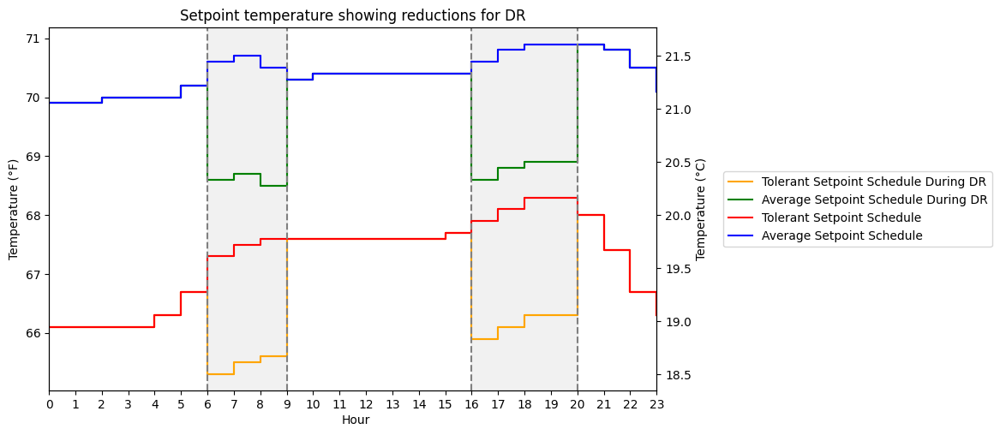

In [25]:
# Assuming df is your dataframe containing the data
# Filter data for January 9, 2022, and January 10, 2022
start_date_9 = '2022-01-09'
end_date_9 = '2022-01-10'
start_date_10 = '2022-01-10'
end_date_10 = '2022-01-11'

df_9 = DR_setpoints[(DR_setpoints['datetime'] >= start_date_9) & (DR_setpoints['datetime'] < end_date_9)]
df_10 = DR_setpoints[(DR_setpoints['datetime'] >= start_date_10) & (DR_setpoints['datetime'] < end_date_10)]

# Extract hour from datetime and create a new 'hour' column
df_9['hour'] = df_9['datetime'].dt.hour
df_10['hour'] = df_10['datetime'].dt.hour

# Plotting
fig, ax1 = plt.subplots(figsize=(12, 5))

# Create a second y-axis for Celsius
ax2 = ax1.twinx()

# Plot Fahrenheit data
ax1.step(df_10['hour'], df_10['Setpoints_Tolerant'], label='Tolerant Setpoint Schedule During DR', color='orange', where='post')
ax1.step(df_10['hour'], df_10['Setpoints_Average'], label='Average Setpoint Schedule During DR', color='green', where='post')
ax1.step(df_9['hour'], df_9['Setpoints_Tolerant'], label='Tolerant Setpoint Schedule', color='red', where='post')
ax1.step(df_9['hour'], df_9['Setpoints_Average'], label='Average Setpoint Schedule', color='blue', where='post')
ax1.set_ylabel('Temperature (°F)', color='black')
ax1.tick_params('y', colors='black')

# Plot Celsius data
ax2.step(df_10['hour'], df_10['Setpoints_Tolerant_C'], label='Setpoints_Tolerant (C)', color='orange', where='post')
ax2.step(df_10['hour'], df_10['Setpoints_Average_C'], label='Setpoints_Average (C)', color='green', where='post')
ax2.step(df_9['hour'], df_9['Setpoints_Tolerant_C'], label='Setpoints_Tolerant (C)', color='red', where='post')
ax2.step(df_9['hour'], df_9['Setpoints_Average_C'], label='Setpoints_Average (C)', color='blue', where='post')
ax2.set_ylabel('Temperature (°C)', color='black')
ax2.tick_params('y', colors='black')

# Set x-axis labels
plt.xlabel('Hour of the day')
plt.xticks(range(24))  # Assuming data spans across 24 hours
plt.xlim(0, 23)  # Set the x-axis limit from 0 to 23 (24 hours)

# Set title
plt.title('Setpoint temperature showing reductions for DR')

# Add vertical dashed lines at specific hours
hours = [6, 9, 16, 20]
for hour in hours:
    plt.axvline(x=hour, color='gray', linestyle='--')

# Add light shading between hours 6-8 and hours 16-20
plt.axvspan(6, 9, color='lightgray', alpha=0.3)
plt.axvspan(16, 20, color='lightgray', alpha=0.3)

# Add legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1
labels = labels1

plt.legend(lines, labels, loc='center left', bbox_to_anchor=(1.10, 0.5))
#plt.legend(lines, labels, loc='upper right')
plt.tight_layout()
fig.text(0.35, 0, 'Hour', ha='center')
plt.show()

### Plot the following KPIs on a horizontal bar graph with LOD 1 as the baseline

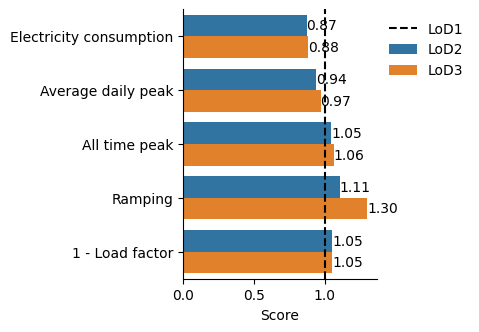

In [26]:
##KPIs: net electricity consumption, average daily peak demand, ramping, load factor, cost; comparing LOD 1, LOD 2, LOD 3
### Note: may not include all KPIs in final paper, for example ramping, 1 - LF may not be relevant/necessary since we didn't
### really do anything to specifically target these KPIs

directory = os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, 'kpi')
os.makedirs(directory, exist_ok=True)

def get_kpis(lod: str, electricity_consumption: list, cost: list):
    return {
        'LoD': 'LoD' + (lod.split('_')[-1]),
        # 'Cost': CostFunction.cost(cost)[-1],
        'Electricity consumption': CostFunction.electricity_consumption(electricity_consumption)[-1],
        'Average daily peak': CostFunction.peak(electricity_consumption, window=24)[-1],
        'All time peak': CostFunction.peak(electricity_consumption, window=ldata.shape[0] + 1)[-1],
        'Ramping': CostFunction.ramping(electricity_consumption)[-1],
        '1 - Load factor': CostFunction.one_minus_load_factor(electricity_consumption, window=730)[-1],
    }

records = []
building_kpis = [
    # 'Cost', 
    'Electricity consumption'
]

# building level
for (b, l), ldata in data_reg.groupby(['bldg_name', 'lod']):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    record = {
        'environment': b,
        **get_kpis(l, electricity_consumption, cost)
    }
    records.append(record)

# district level
plot_data = data_reg.copy()
plot_data = plot_data.groupby(['lod', 'bldg_name', 'time_step'])[[
    'net_electricity_consumption', 'net_electricity_consumption_cost'
]].sum().reset_index()

for l, ldata in plot_data.groupby('lod'):
    electricity_consumption = ldata['net_electricity_consumption'].tolist()
    cost = ldata['net_electricity_consumption_cost'].tolist()
    _record = get_kpis(l, electricity_consumption, cost)
    record = {
        'environment': 'district',
        **_record,
        **{k: np.mean([r[k] for r in records if r['environment'] != 'district' and r['LoD'] == _record['LoD']]) for k in building_kpis}
    }
    records.append(record)

kpis = pd.DataFrame(records)
kpis = kpis.melt(id_vars=['environment', 'LoD'])
lod1_kpis = kpis[kpis['LoD']=='LoD1'].copy()
lod1_kpis = lod1_kpis.rename(columns={'value': 'lod1_value'}).drop(columns=['LoD'])
kpis = kpis.merge(lod1_kpis, on=['environment', 'variable'])
kpis['norm_value'] = kpis['value']/kpis['lod1_value']
kpis = kpis[kpis['LoD']!='LoD1'].copy()

for e, edata in kpis.groupby('environment'):
    fig, ax = plt.subplots(1, 1, figsize=(2.5, 3.5))
    sns.barplot(data=edata, x='norm_value', y='variable', hue='LoD', order=list(records[0].keys())[2:], ax=ax)
    ax.axvline(1.0, color='black', linestyle='--', label='LoD1')
    ax.set_xlabel('Score')
    ax.set_ylabel(None)

    for s in ['right', 'top']:
        ax.spines[s].set_visible(False)

    for p in ax.patches:
        ax.text(p.get_x() + p.get_width(), p.get_y() + p.get_height()/2.0, f'{p.get_width():0.2f}', ha='left', va='center')

    ax.legend(
        bbox_to_anchor=(1.0, 1.0),
        loc='upper left',
        framealpha=0,
        ncol=1
    )

    plt.savefig(os.path.join(directory, f'{e}.pdf'), bbox_inches='tight', transparent=True)

    if e == 'district':
        plt.show()
    
    else:
        plt.close()

### Plot the number of SP interactions over time (similar to ASHRAE plot maybe?)

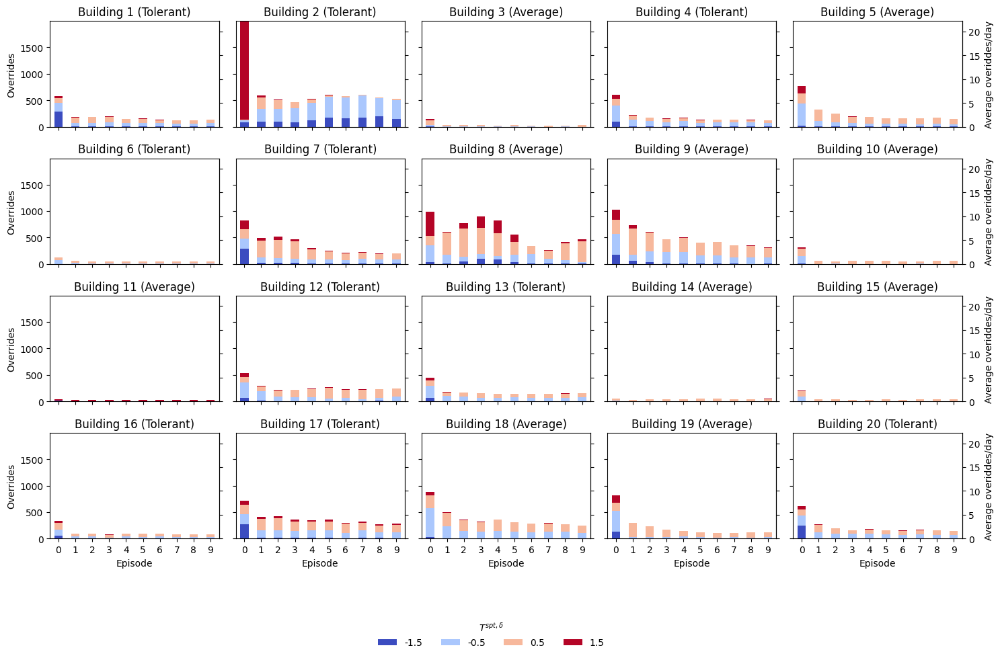

In [27]:
### Similar to ASHRAE plot maybe? SHowing the quantity of the setpoint change as well perhaps
key = 'occupant_interaction_indoor_dry_bulb_temperature_set_point_delta_summary'
simulation_ids = [s for s in SIMULATION_IDS if 'lod_3' in s]
plot_data = {list(s.keys())[0]: list(s.values())[0] for s in [DataHandler.get_evaluation_summary([s]) for s in simulation_ids]}
delta_data_list = []

for k, v in plot_data.items():
    for b, bdata in v[key].items():
        for i, d in enumerate(bdata[2:-1]):
            d = pd.DataFrame(d).T
            d.columns = ['delta', 'count']
            d['bldg_name'] = b
            d['bldg_index'] = metadata[metadata['bldg_name']==b].iloc[0]['bldg_index']
            d['setpoint_id'] = metadata[metadata['bldg_name']==b].iloc[0]['setpoint_id']
            d['episode'] = i
            d['random_seed'] = v['random_seed']
            delta_data_list.append(d)

delta_data = pd.concat(delta_data_list, ignore_index=True)
delta_data = delta_data[delta_data['delta']!=0.0].copy()
ymax = delta_data.groupby(['bldg_index', 'episode'])['count'].sum().max()
days = (data_reg['time_step']/24).astype(int).max() + 1
building_count = len(delta_data['bldg_name'].unique())
column_count_limit = 5
row_count = math.ceil(building_count/column_count_limit)
column_count = min(building_count, column_count_limit)
fig, _ = plt.subplots(row_count, column_count, figsize=(3.5*column_count, 2.5*row_count), sharex=True, sharey=True, gridspec_kw={'hspace': 0.3, 'wspace': 0.1})

for ax in fig.axes[building_count:]:
    fig.delaxes(ax)

for i, (ax, ((b, s), bdata)) in enumerate(zip(fig.axes, delta_data.groupby(['bldg_index', 'setpoint_id', ]))):
    bdata = bdata[bdata['random_seed']==bdata['random_seed'].max()].pivot(index='episode', columns='delta', values='count')
    bdata.plot(kind='bar', stacked=True, ax=ax, colormap='coolwarm')
    ax.set_xlabel('Episode')
    ax.set_ylabel('Overrides')
    ax.margins(0)
    ax.tick_params(axis='x', rotation=0)
    ax.set_title(f'Building {b} ({s})')
    secax_y = ax.secondary_yaxis('right', functions=(lambda x: x/days, lambda x: x*days))

    if i == 0:
        ax.legend(
            title=r'$T^{spt, \delta}$',
            bbox_to_anchor=(0.5, 0.0),
            loc='upper center', 
            bbox_transform=fig.transFigure,
            framealpha=0,
            ncol=len(delta_data['delta'].unique())
        )
    
    else:
        ax.legend().remove()

    if i == building_count - 1 or (i + 1) % column_count_limit == 0:
        secax_y.set_ylabel('Average overiddes/day')
    
    else:
        secax_y.tick_params(labelright=False)

plt.savefig(os.path.join(FileHandler.JOURNAL_PAPER_FIGURES_DIRECTORY, f'override_per_episode.pdf'), bbox_inches='tight', transparent=False)
plt.show()

### Calculate for each building: number of overrides during DR events, total # of overrides

In [28]:
### see this file for details on when the DR events occur:
### file_path = '/root/CityLearn/simulation/data/DR_Setpoints_Electricity_Prices/DR_Events_2022.csv'
### Columns: 'DR_Event_Timestep' == 1 if timestep is a DR_Event, else 0
    ####     'DR_Event_Start' == 1 is first timestep of a DR event, else 0
    ####     'DR_Event' == counting integer for each unique DR event, e.g. event 2 is 2 (25 total), else 0
    ####     'DR_Day' == not zero if that day has a DR_event, else 0

dr_data = pd.read_csv(os.path.join(FileHandler.DATA_DIRECTORY, 'DR_Setpoints_Electricity_Prices', 'DR_Events_2022.csv'))
plot_data = data_reg.merge(dr_data[['time_step', 'DR_Event_Timestep']], on='time_step', how='left')
plot_data['override_during_dr'] = 0 
plot_data.loc[
    (plot_data['DR_Event_Timestep']==1) 
    & (plot_data['occupant_interaction_indoor_dry_bulb_temperature_set_point_delta'].abs()>0), 
    'override_during_dr'
] = 1
plot_data = plot_data.groupby(['lod', 'bldg_index'])[['override_during_dr']].sum().reset_index()
plot_data = plot_data.pivot(index='bldg_index', columns='lod', values='override_during_dr')
display(plot_data)

lod,lod_1,lod_2,lod_3
bldg_index,,,
1,5,5,14
2,5,3,7
3,0,3,2
4,3,5,8
5,1,5,12
6,1,3,3
7,4,4,25
8,10,3,29
9,0,7,39


### Calculate for each building: number of discomfort hours (>2C between T_in and T_SP) 

In [29]:
### (perhaps compare to lOD 2?)
band = 2
plot_data = data_reg[data_reg['lod'] != 'lod_1'].copy()
plot_data['delta'] = plot_data['indoor_dry_bulb_temperature'] - plot_data['indoor_dry_bulb_temperature_set_point']
plot_data['discomfort'] = 0
plot_data.loc[plot_data['delta'].abs() > band, 'discomfort'] = 1
plot_data = plot_data.groupby(['lod', 'bldg_index'])[['discomfort']].sum()
plot_data['discomfort_percentage'] = plot_data['discomfort']*100.0/(data_reg['time_step'].max() + 1)
plot_data = plot_data.reset_index().pivot(index='bldg_index', columns='lod', values='discomfort')
display(plot_data)

lod,lod_2,lod_3
bldg_index,,
1,22,248
2,31,837
3,21,34
4,18,63
5,25,131
6,16,18
7,36,329
8,33,1506
9,68,599
